# **Detección de Distanciamiento Físico vía YOLOv5 : Parte 01**

## **Tratamiento de Datos**

In [1]:
# Verificando el GPU de Colab.
import torch
from IPython.display import Image, clear_output
clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [2]:
# Instalar pre-requisitos para el tratamiento de datos

# Librería que nos permitirá descargar las imágenes de OID (Open Image Dataset)
# https://github.com/monocongo/openimages
!pip install openimages
!apt-get install tree

     |████████████████████████████████| 51kB 5.0MB/s 
     |████████████████████████████████| 137.3MB 84kB/s 
     |████████████████████████████████| 296kB 55.5MB/s 
  Created wheel for ImageHash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291991 sha256=341aceb704019f5a9fc2a7b9e9f80fc7a610961bd54fbdae56dd3e79b94fad1a
  Stored in directory: /root/.cache/pip/wheels/07/1c/dc/6831446f09feb8cc199ec73a0f2f0703253f6ae013a22f4be9
Successfully built ImageHash
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 39 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB

In [3]:
# Importar libreríaas necesarias.

import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from openimages.download import download_dataset
from os import listdir
import shutil
from sklearn.model_selection import train_test_split
from pathlib import Path

In [4]:
# Eliminamos carpetas en caso se vuelve a correr el notebook.
!rm -rf imgs persons_ds yolov5

In [5]:
# Descargamos imágenes de OID
# Descargar 5000 imágenes con sus anotaciones tipo "darknet", esta anotación nos ayudará
# en generar de forma rápida las etiquetas para dataset de entrenamiento.
# Solo se descarga imágenes de clase persona.
download_dataset("imgs", ["Person"], annotation_format="darknet", limit = 5000)

2020-09-05  22:51:14 INFO Downloading 5000 train images for class 'person'
100%|██████████| 5000/5000 [02:12<00:00, 37.84it/s]
2020-09-05  22:53:27 INFO Creating 5000 train annotations (darknet) for class 'person'
100%|██████████| 5000/5000 [00:01<00:00, 2908.65it/s]


{'person': {'annotations_dir': 'imgs/person/darknet',
  'images_dir': 'imgs/person/images'}}

In [6]:
# Algunas variables
label_source_path = "imgs/person/darknet/"
image_source_path = "imgs/person/images/"

(-0.5, 1023.5, 682.5, -0.5)

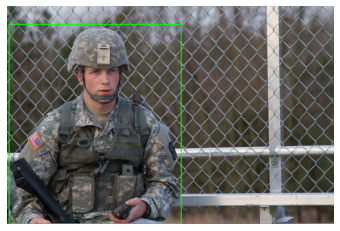

In [7]:
# Revisamos una imagen y dibujamos su cuadro delimitador.
bbox = []
with open(f"{label_source_path}00001bcc92282a38.txt") as f:
  for line in f:
    bbox.append([float(v) for v in line.split()])

img = cv2.cvtColor(cv2.imread(f"{image_source_path}00001bcc92282a38.jpg"), cv2.COLOR_BGR2RGB)

H,W, _ = img.shape

x = bbox[0][1]
y = bbox[0][2]
w = bbox[0][3]
h = bbox[0][4]

x1 = (x - w/2) * W
y1 = (y - h/2) * H
x2 = (x + w/2) * W
y2 = (y + h/2) * H
cv2.rectangle(img,(int(x1), int(y1)), (int(x2), int(y2)), color = (0,255,0), thickness = 2)

plt.imshow(img)
plt.axis("off")

In [8]:
# Cargando todos las etiquetas que existan en el dataset.
persons = [f[:-4] for f in listdir(label_source_path)]

El formato de YOLO debe connsiderar lo siguiente:  

- Un archivo (.txt) por imagen.
- Dentro de cada archivo txt debe existir tantas filas como tantos objetos existan en la imagen.
- Cada fila debe tener el formato **`clase centro_x centro_y ancho alto`**
- Las imágens deben estar localizadas en `/images/*.jpg` y las etiquetas en `/labels/*.txt`. Este sería un ejemplo:
```bash
../persons_ds/images/000000109622.jpg  # imagen
../persons_ds/labels/000000109622.txt  # etiqueta
```


In [9]:
# Función de ayuda para la creación de dataset requerido para el entrenamiete con YOLOv5.
def dataset_creation(persons, dataset_type):
    label_destiny_path = f"persons_ds/labels/{dataset_type}/" 
    image_destiny_path = f"persons_ds/images/{dataset_type}/" 

    images_path = Path(image_destiny_path)
    images_path.mkdir(parents = True, exist_ok = True)
    
    labels_path = Path(label_destiny_path)
    labels_path.mkdir(parents = True, exist_ok = True)

    for id, per in enumerate(persons):
        image_name = f"{per}.jpg"
        label_name = f"{per}.txt"

        shutil.move(label_source_path + label_name, label_destiny_path + label_name)
        shutil.move(image_source_path + image_name, image_destiny_path + image_name)

In [10]:
train_persons, val_persons = train_test_split(persons, test_size=0.2)
len(train_persons), len(val_persons)

(4000, 1000)

In [11]:
dataset_creation(train_persons, "train")
dataset_creation(val_persons, "val")
shutil.rmtree("imgs", ignore_errors=True)

In [12]:
!tree persons_ds/ -L 2

persons_ds/
├── images
│   ├── train
│   └── val
└── labels
    ├── train
    └── val

6 directories, 0 files


In [13]:
# Librerías bases
import torch
import yaml
from IPython.display import Image, clear_output

Descargando YOLOv5. YOLO nos brinda un entorno de trabajo para hacer inferencias, entrenamiento y pruebas.

In [14]:
# Descargando yolov5
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5 
!pip install -qr requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 2479 (delta 3), reused 7 (delta 2), pack-reused 2468
Receiving objects: 100% (2479/2479), 5.33 MiB | 7.75 MiB/s, done.
Resolving deltas: 100% (1626/1626), done.
/content/yolov5
     |████████████████████████████████| 276kB 6.3MB/s 


Para la inferencia YOLO necesita dos archivos:
- Configuración del dataset, `person.yaml`, el cual contiene la datos de ubicación de la imágenes y etiquitas.
- Configuración del modelo, `model.yolov5x.yaml`, el cual contiene los niveles que tendrá la arquitectura de la red YOLO.

In [15]:
# Copiando la configuración de la ubicación del dataset (person.yaml)
!gdown --id 1z7XrzJQQmBqQt3TcbGFHaWG07-LuLAe8 -O data/person.yaml
# Copiando la configuración de la arquitectura de la CNN (model.yolo5x.yaml)
!gdown --id 13UE28NRCopjOhuee_HNcDI6ImdpjrOjX -O models/model.yolov5x.yaml

Downloading...
From: https://drive.google.com/uc?id=1z7XrzJQQmBqQt3TcbGFHaWG07-LuLAe8
To: /content/yolov5/data/person.yaml
100% 207/207 [00:00<00:00, 184kB/s]
Downloading...
From: https://drive.google.com/uc?id=13UE28NRCopjOhuee_HNcDI6ImdpjrOjX
To: /content/yolov5/models/model.yolov5x.yaml
100% 1.50k/1.50k [00:00<00:00, 4.95MB/s]


El modelo utilizado usa el modelo base `yolov5.yaml`, el cual esta conformado por 24 submodelos entre BottleneckCSP, Convolucionales, etc. El modelo llegar a tener 407 capas.

In [16]:
# revisando el modelo
!cat models/model.yolov5x.yaml

# parameters
nc: 1  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1

In [17]:
# Realizando el entrenamiento
torch.cuda.empty_cache() 

!python train.py --img-size 640 640 --batch-size 4 --epochs 30 \
  --data ./data/person.yaml --cfg ./models/model.yolov5x.yaml --weights yolov5x.pt \
  --name yolov5x_person --cache-images

Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(adam=False, batch_size=4, bucket='', cache_images=True, cfg='./models/model.yolov5x.yaml', data='./data/person.yaml', device='', epochs=30, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov5x_person', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=4, weights='yolov5x.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

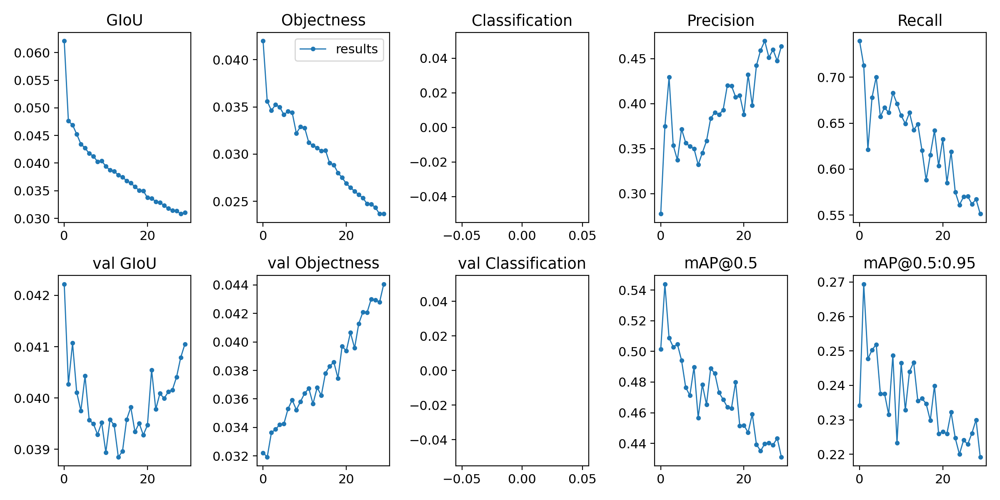

In [25]:
Image(filename='runs/exp0_yolov5x_person/results.png', width=1200) 

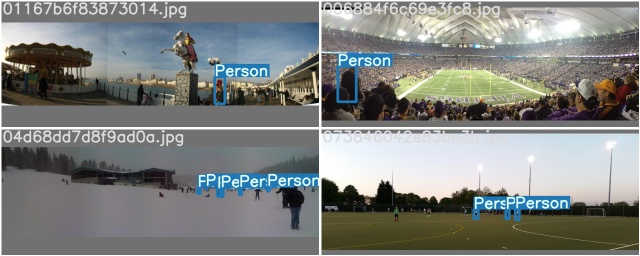

In [29]:
Image(filename='runs/exp0_yolov5x_person/test_batch0_gt.jpg', width=500) 

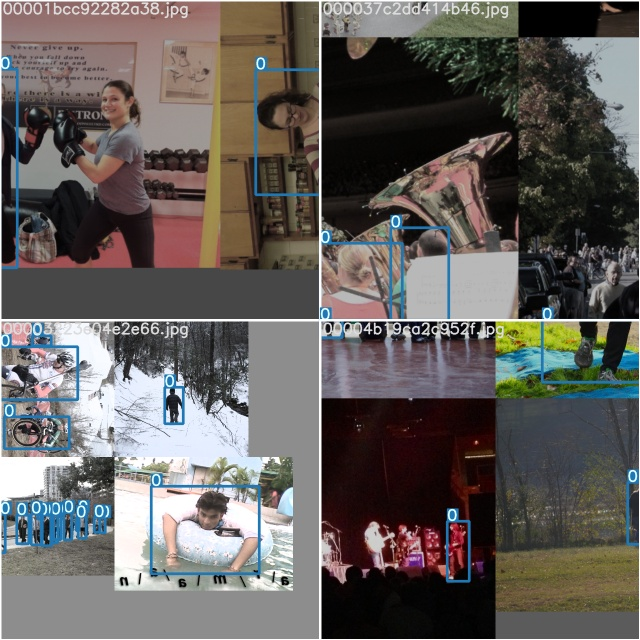

In [30]:
Image(filename='runs/exp0_yolov5x_person/train_batch0.jpg', width=500) 

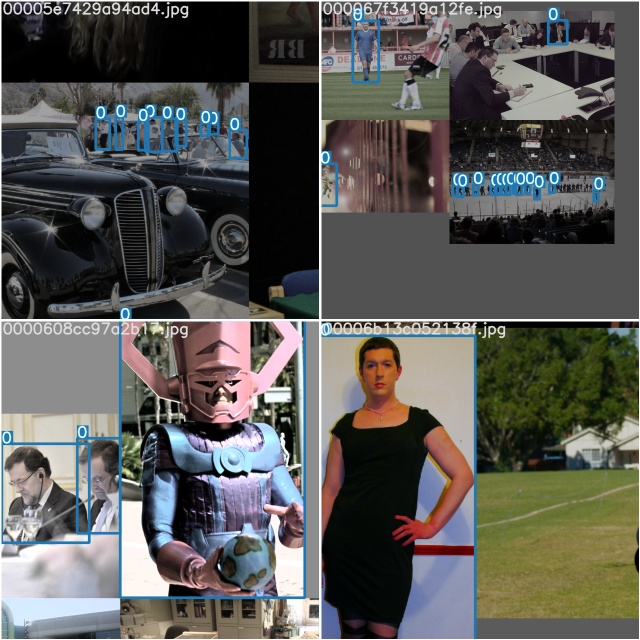

In [31]:
Image(filename='runs/exp0_yolov5x_person/train_batch1.jpg', width=500) 


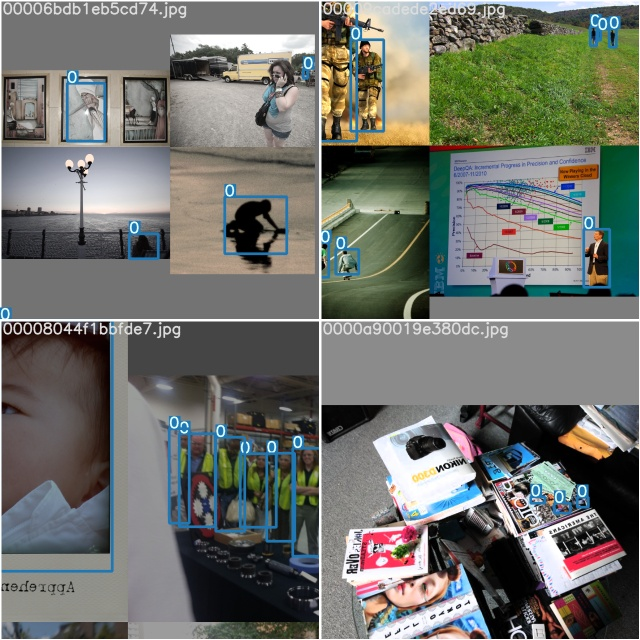

In [32]:
Image(filename='runs/exp0_yolov5x_person/train_batch2.jpg', width=500) 


In [21]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [22]:
!rm -rf "/content/gdrive/My Drive/Yolo5Notebooks/runs"

In [23]:
shutil.copytree("runs","/content/gdrive/My Drive/Yolo5Notebooks/runs")

'/content/gdrive/My Drive/Yolo5Notebooks/runs'